<a href="https://colab.research.google.com/github/Claptar/spatialMPFC/blob/main/DE/mammals/ANOVA_zscore/ANOVA_results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies and files

## Install dependencies

In [1]:
!python --version

Python 3.10.11


In [ ]:
!pip install scanpy[leiden] --quiet

import os
os.kill(os.getpid(), 9)

## Imports

In [1]:
import warnings
import scanpy as sc

import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

Нужно подключить свой гугл диск

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
dir_path = 'drive/MyDrive/Spatial project/data/'

In [4]:
de_dir_path = 'drive/MyDrive/Spatial project/results/DE/mammals/ANOVA/'

In [5]:
os.listdir(de_dir_path)

['anova_L3.csv',
 'anova_L6.csv',
 'anova_L5.csv',
 'anova_L4.csv',
 'anova_L2.csv',
 'anova_L1.csv',
 'anova_WM.csv',
 'genes_clusters.csv',
 'anova_mamm.csv',
 'ttest_mamm.csv',
 'anova_zscore_mamm.csv',
 'ttest_zscore_mamm.csv',
 'anova_human_sig_genes.csv']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_zscore_mamm.csv', index_col=0)
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
NOC2L,5.990471,12.0,0.786369,0.662606,0.736513
HES4,15.867262,12.0,1.998201,0.036421,0.089486
AGRN,15.368378,12.0,2.920726,0.002353,0.011859
SDF4,16.021979,12.0,1.833708,0.058172,0.125907
B3GALT6,13.207995,12.0,1.886929,0.050056,0.113088


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_zscore_mamm.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.337496,0.747237,0.874437
1,DVL1,L1,human,chimp,-0.541166,0.607885,0.786700
2,ANKRD65,L1,human,chimp,-0.558791,0.596527,0.779552
3,TMEM240,L1,human,chimp,2.100462,0.080426,0.283097
4,SSU72,L1,human,chimp,-0.306706,0.769432,0.888220


## Load pseudobulks

In [8]:
pb_dir_path = 'drive/MyDrive/Spatial project/data/pseudobulks/'

In [9]:
os.listdir(pb_dir_path)

['expression_chimp.csv',
 'expression_human.csv',
 'expression_macaque.csv',
 'expression_spatial_libd_human.csv',
 'expression_sum_chimp.csv',
 'expression_mean_chimp.csv',
 'annotation_chimp.csv',
 'expression_sum_human.csv',
 'expression_mean_human.csv',
 'annotation_human.csv',
 'expression_sum_macaque.csv',
 'expression_mean_macaque.csv',
 'annotation_macaque.csv',
 'expression_sum_spatial_libd_human.csv',
 'expression_mean_spatial_libd_human.csv',
 'annotation_spatial_libd_human.csv',
 'pb_age_sample_norm.h5ad',
 'pb_mamm.h5ad',
 'pb_age.h5ad',
 'pb_mamm_sample_norm.h5ad',
 'pb_mamm_sample_norm_zscore.h5ad',
 'pb_mamm_sample_norm_filtered.h5ad',
 'pb_mamm_sample_zscore_filtered.h5ad']

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mamm_sample_zscore_filtered.h5ad')
adata_pb_norm

AnnData object with n_obs × n_vars = 94 × 9177
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [11]:
adata_pb = sc.read_h5ad(pb_dir_path + 'pb_mamm.h5ad')
adata_pb = adata_pb[:, adata_pb_norm.var_names]
adata_pb

View of AnnData object with n_obs × n_vars = 94 × 9177
    obs: 'layer', 'sample_id', 'condition'

### Preprocess pseudobulk

In [12]:
# preprocess
adata_pb.raw = adata_pb
sc.pp.normalize_total(adata_pb, target_sum=1e4)
sc.pp.log1p(adata_pb)
sc.pp.pca(adata_pb)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)


In [13]:
mito = adata_pb.var_names.str.startswith('MT-')
hb = adata_pb.var_names.str.contains(("^HB[AB]"))
rb = adata_pb.var_names.str.contains(("^RP[LS]"))
remove = mito | hb | rb
genes_to_remove = adata_pb.var_names[remove].tolist()

keep = np.invert(remove)
print(sum(remove))

adata_pb = adata_pb[:,keep]

66


# Результаты дифф. экспрессии

## Число генов и р-value

In [14]:
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_genes

Index(['AGRN', 'DVL1', 'ANKRD65', 'TMEM240', 'SSU72', 'NADK', 'GNB1', 'GABRD',
       'PRXL2B', 'TP73',
       ...
       'BACE2', 'RSPH1', 'SLC37A1', 'NDUFV3', 'PFKL', 'COL18A1', 'COL6A2',
       'LSS', 'S100B', 'PRMT2'],
      dtype='object', length=3030)

<Axes: >

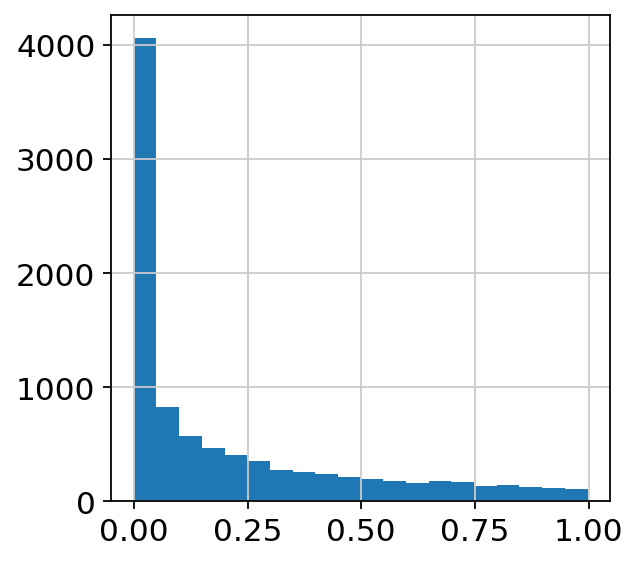

In [15]:
anova_res['PR(>F)'].hist(bins=20)

## Кластеризация

### PCA

In [16]:
adata_norm_anova = adata_pb_norm[:, anova_genes]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,AGRN,DVL1,ANKRD65,TMEM240,SSU72,NADK,GNB1,GABRD,PRXL2B,TP73,...,BACE2,RSPH1,SLC37A1,NDUFV3,PFKL,COL18A1,COL6A2,LSS,S100B,PRMT2
WM.human_759,-0.587642,-1.286920,-0.576363,-0.380628,-1.240666,-0.392693,-0.483084,1.407974,-1.723192,-0.575693,...,1.663989,-0.853375,0.108966,1.184652,-0.296019,0.451466,-0.369064,0.092059,-0.042967,1.253488
L5.human_759,1.094423,1.414952,-1.222106,0.233035,0.754170,0.448221,-0.064083,-1.209941,1.176506,1.122923,...,-0.193109,-0.151853,-0.479464,0.629778,1.208178,-0.710780,0.304512,-0.169775,-0.537374,-0.526195
L2.human_759,-1.277248,0.964704,0.650609,-1.162999,-0.640948,0.108590,0.628976,-1.415981,0.472657,-0.575693,...,-1.020090,-0.139459,-0.288884,-1.301912,-0.120254,-0.080200,-0.826952,-1.230646,-0.326309,0.483770
L3.human_759,0.756057,0.444693,1.486085,-0.707314,-0.067968,-0.630942,0.897363,0.611384,0.636499,-0.575693,...,-0.588087,0.970978,2.015851,-0.055335,0.083201,-0.594761,-0.448602,-0.094067,-0.521819,-0.858786
L1.human_759,-0.817474,-1.011764,0.533377,-0.439762,-1.006580,-0.664288,-1.988908,0.109069,-0.541418,1.755542,...,-0.323078,-0.830365,-1.163481,-1.423419,-1.496799,2.068523,2.137224,1.874792,2.236604,0.875016


In [17]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

In [18]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_norm_anova.X.T)

In [19]:
fig = px.scatter(components, x=0, y=1)
fig.show()

### Кластеризация всех значимых генов

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



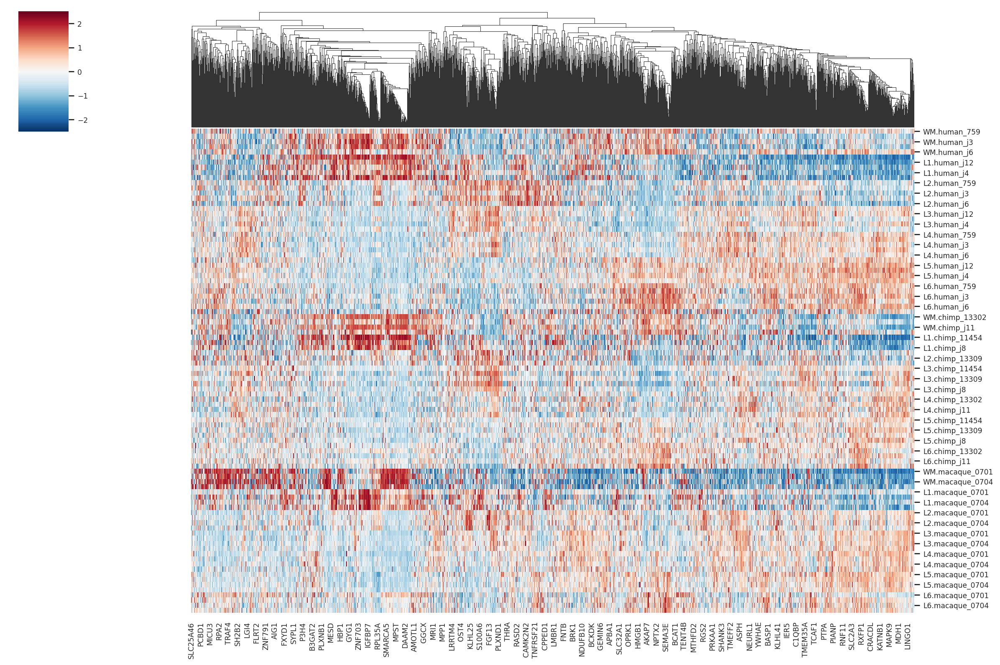

In [20]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('heatmap_norm.png')

Сделаем кластеризацию по слоям

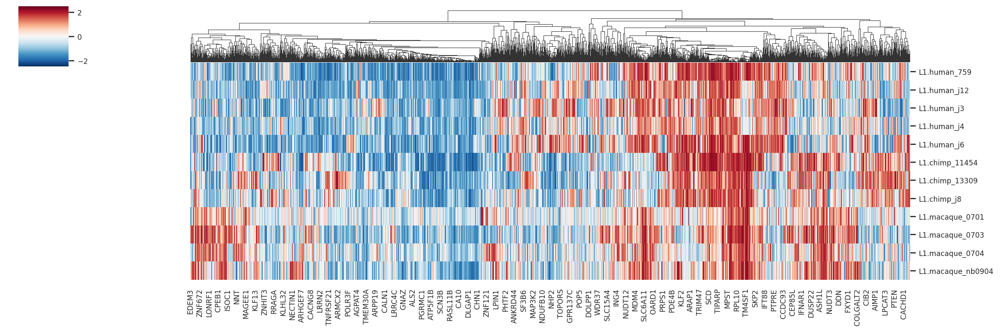

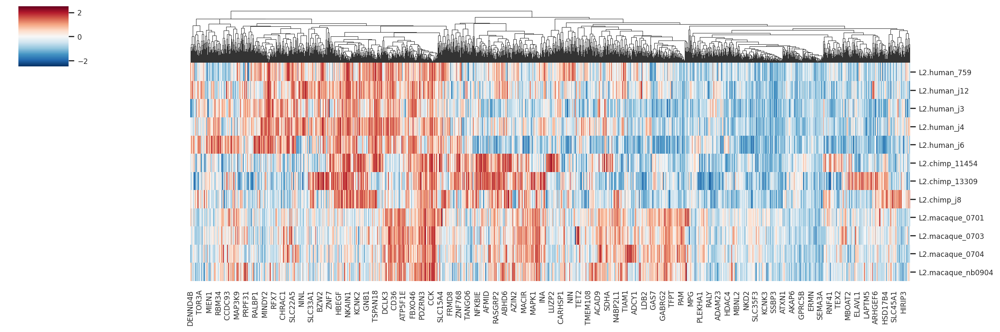

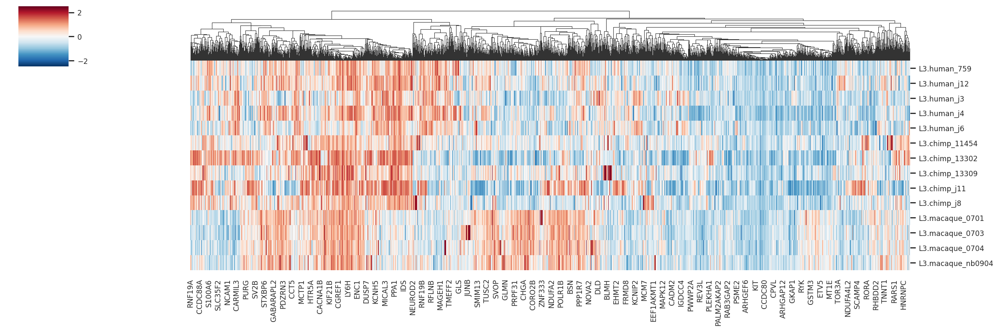

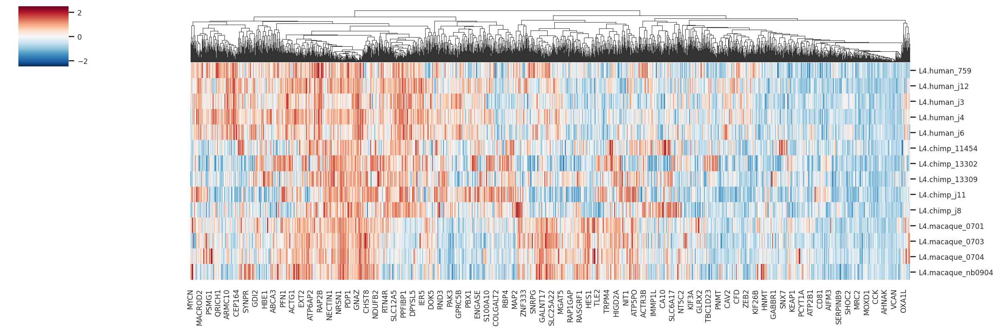

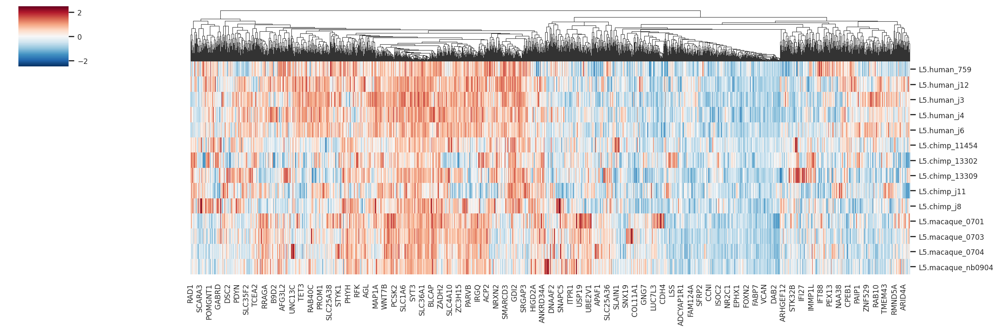

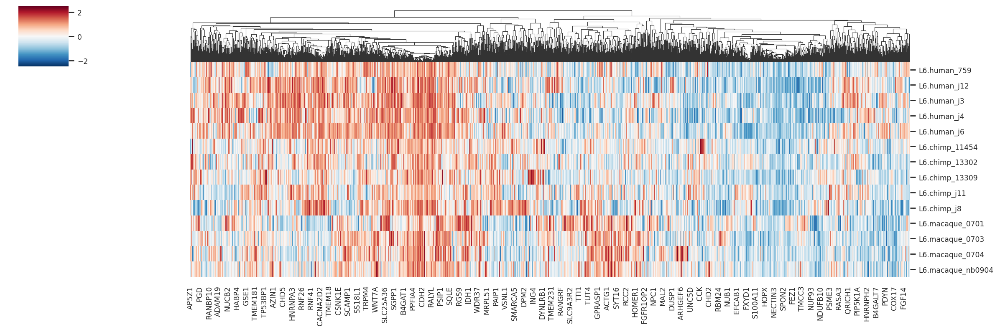

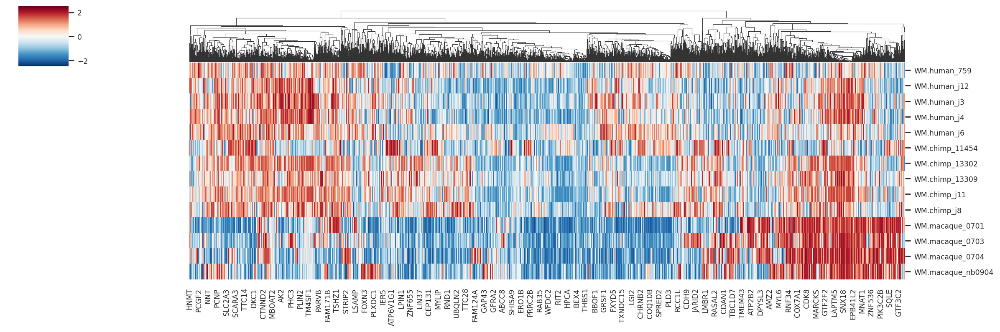

In [21]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(15, 5), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False).savefig(f'heatmap_norm_{layer}.png')

Сделаем кластеризацию по видам

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



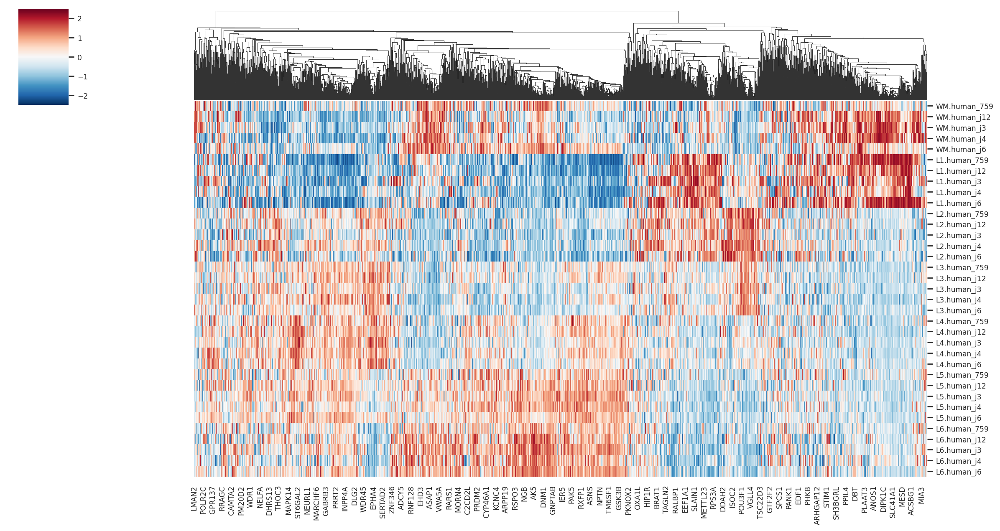

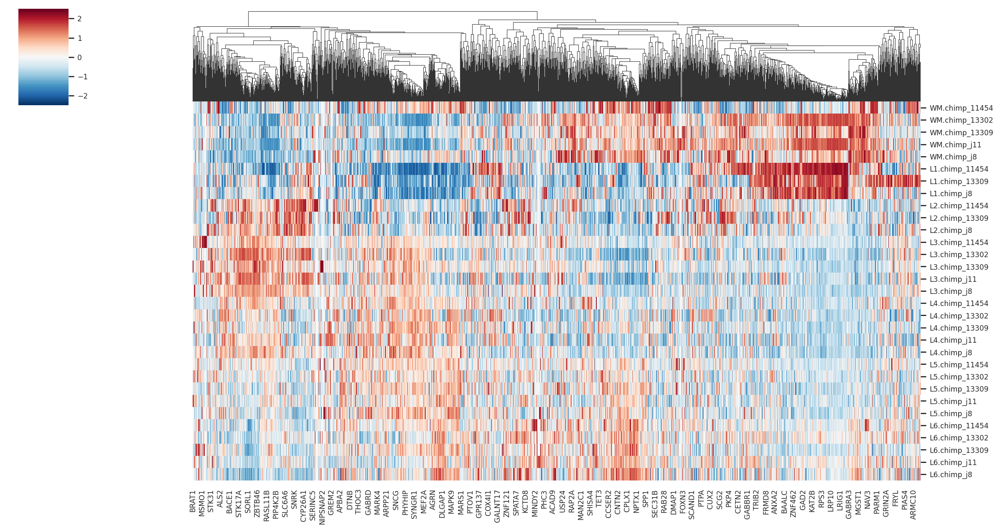

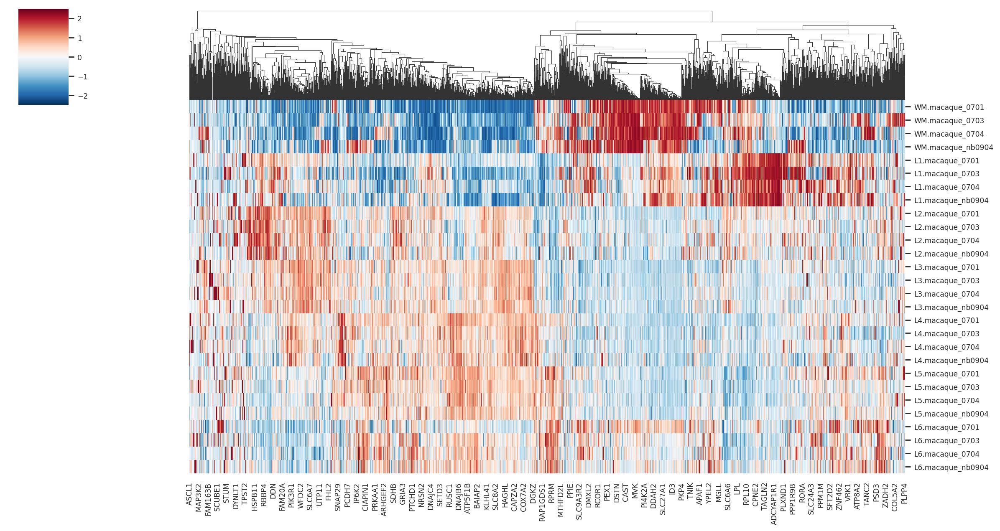

In [22]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df.loc[df.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False).savefig(f'heatmap_norm_{cond}.png')

## Кластеризация генов уникальных для человека

In [23]:
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.337496,0.747237,0.874437
1,DVL1,L1,human,chimp,-0.541166,0.607885,0.786700
2,ANKRD65,L1,human,chimp,-0.558791,0.596527,0.779552
3,TMEM240,L1,human,chimp,2.100462,0.080426,0.283097
4,SSU72,L1,human,chimp,-0.306706,0.769432,0.888220


Оставим только значимые различия с человеком

In [24]:
human_specific = ttest_res[(ttest_res.p_val_adj < 0.05) & (ttest_res.group1 == 'human')]
human_specific

,gene,layer,group1,group2,score,pvalue,p_val_adj
5,NADK,L1,human,chimp,-5.639509,0.001332,0.040463
91,PPCS,L1,human,chimp,-7.809589,0.000233,0.017314
144,S1PR1,L1,human,chimp,5.339235,0.001763,0.046280
168,ANKRD34A,L1,human,chimp,-6.823234,0.000486,0.025661
203,RGS5,L1,human,chimp,5.267058,0.001889,0.048060
...,...,...,...,...,...,...,...
6000,KCNJ4,WM,human,macaque,4.891332,0.001771,0.032304
6044,ETS2,WM,human,macaque,4.603687,0.002473,0.037706
6048,PCP4,WM,human,macaque,5.181939,0.001278,0.027390
6053,NDUFV3,WM,human,macaque,4.343356,0.003382,0.043241


In [25]:
# посчитаем число уникальных генов
human_specific_genes = human_specific.gene.unique().tolist()
len(human_specific_genes)

1373

### Построим барплот числа генов по слоям

In [26]:
count_df = human_specific.groupby('layer', group_keys=True, as_index=False).gene.value_counts()
count_df['cond'] = count_df['count'].map({1: 'cond', 2: 'both'})
count_df.set_index('gene', inplace=True)
count_df.head()

,layer,count,cond
gene,,,
PPCS,L1,2,both
PPM1E,L1,2,both
PPP1R1B,L1,2,both
PRKCA,L1,2,both
REPIN1,L1,2,both


In [27]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    genes = count_df[(count_df['count'] == 1) & (count_df['layer'] == layer)].index.tolist()
    conditions = human_specific[(human_specific.gene.isin(genes)) & (human_specific.layer == layer)].copy()
    conditions.set_index('gene', inplace=True)
    count_df.loc[(count_df.index.isin(genes)) & (count_df.layer == layer), ['cond']] = conditions.group2

<Axes: xlabel='layer', ylabel='count'>

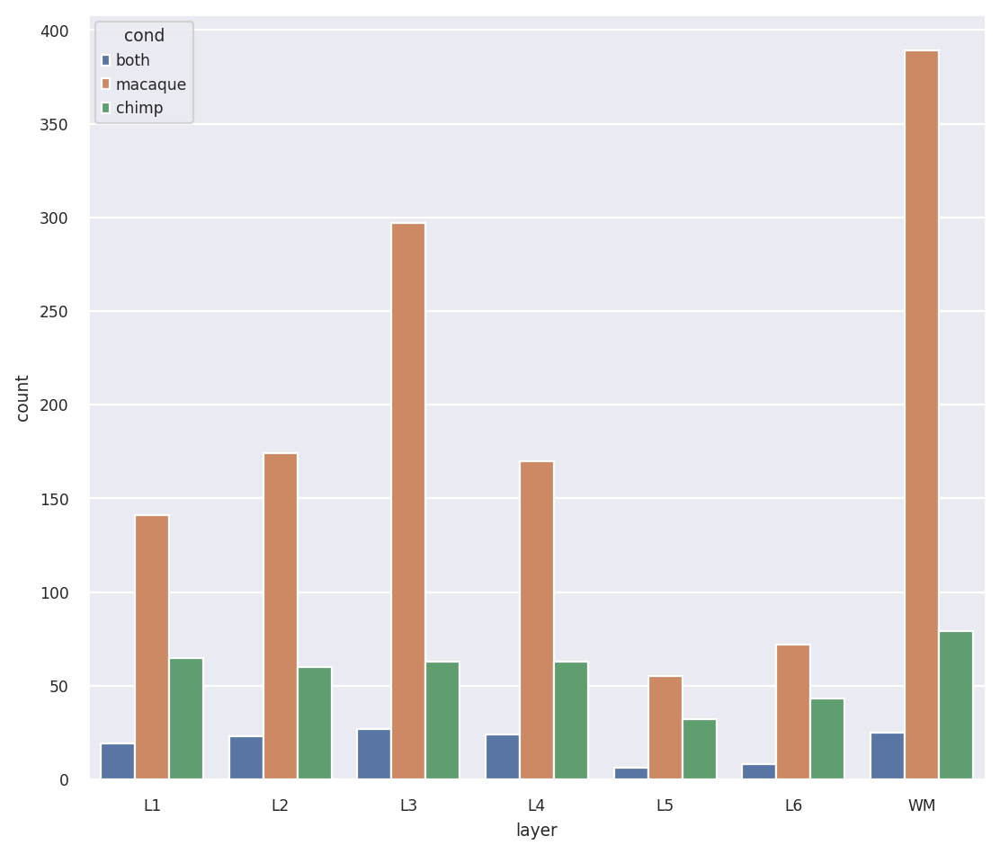

In [28]:
fig, ax = plt.subplots(figsize=(8, 7))
sns.countplot(data=count_df, x="layer", hue='cond', ax=ax)

In [29]:
count_df.to_csv('anova_zscore_human_sig_genes.csv')

### Хитмапа для человеко-специфичных генов

#### Все гены человеко-специфичные

In [30]:
df_hs = df[human_specific_genes].copy()
df_hs.head()

,NADK,PPCS,S1PR1,ANKRD34A,RGS5,ACBD6,CENPF,RAB3GAP2,PRKCE,ARID5A,...,TTC9B,TMEM91,TRPM4,PRKCG,CACNG8,SEPTIN5,UBE2L3,PATZ1,PCP4,LSS
WM.human_759,-0.392693,0.758167,-0.341390,-0.385661,-1.119115,0.234280,0.602467,1.151775,0.711563,-1.148706,...,0.962971,1.734106,0.967121,0.114286,1.272133,0.405262,-0.188423,-0.409915,0.664639,0.092059
WM.human_j12,-1.174512,0.004118,0.729631,0.176531,0.647730,0.083759,0.426017,0.322212,-1.127161,-0.951966,...,-0.237603,1.314109,0.827528,-0.178470,0.297607,-0.677120,1.021133,-0.340493,1.203625,-0.663592
WM.human_j3,-0.114208,0.425269,1.824201,1.700460,0.653274,-1.248738,0.372737,1.633633,0.365294,2.079243,...,-0.433110,-0.047611,1.019028,0.239171,1.071198,-0.478593,0.697600,-1.593386,1.888713,-0.134944
WM.human_j4,-1.918331,-1.003522,1.524886,-1.029257,1.516146,-0.030945,1.805241,1.345547,-0.263022,-0.143983,...,0.615158,0.255219,-0.548229,0.509150,1.034533,-1.010869,-0.624215,-1.673908,1.116820,-0.337427
WM.human_j6,0.456789,0.489268,1.404445,0.151627,0.673295,-0.300634,-0.469373,0.686061,1.254184,-0.992157,...,0.295009,1.557068,1.168280,0.203140,-0.095105,0.586237,-1.148388,-0.266599,2.067472,-0.357347


/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



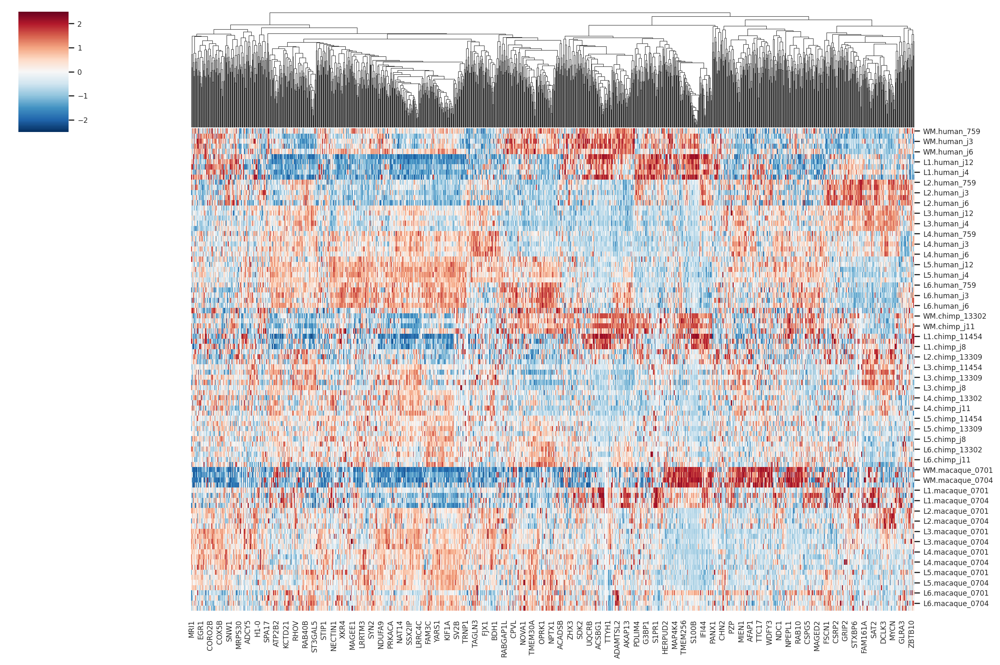

In [31]:
sns.clustermap(df_hs.loc[sample_order['all']], figsize=(15, 10), cmap="RdBu_r", metric='cosine', center=0, vmax=2.5, vmin=-2.5, annot_kws={"size": 2}, row_cluster=False).savefig('heatmap_norm_hs.png')

Сделаем кластеризацию по слоям

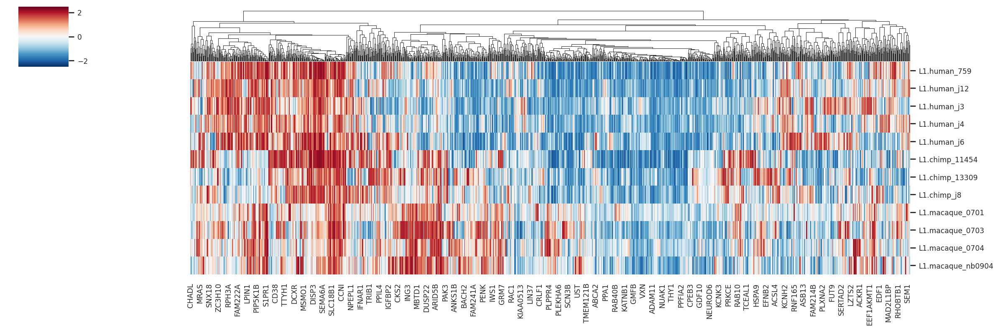

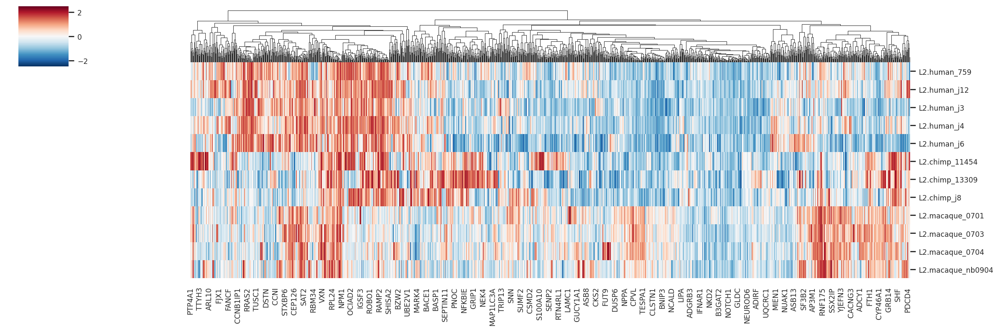

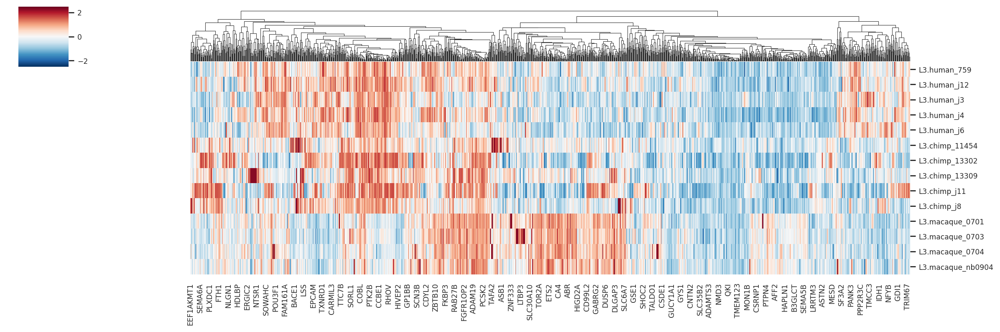

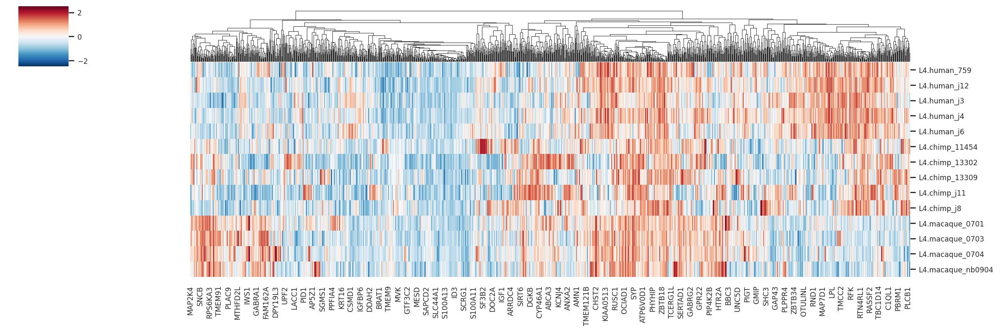

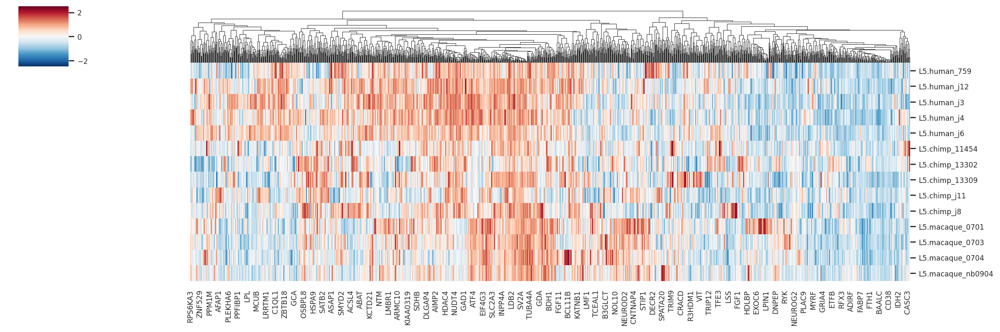

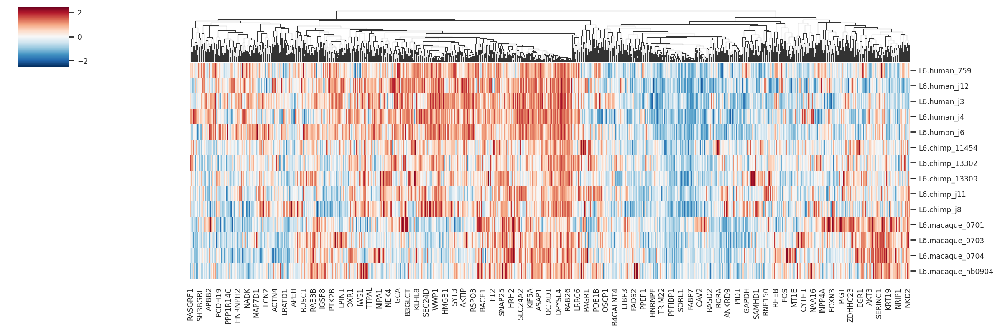

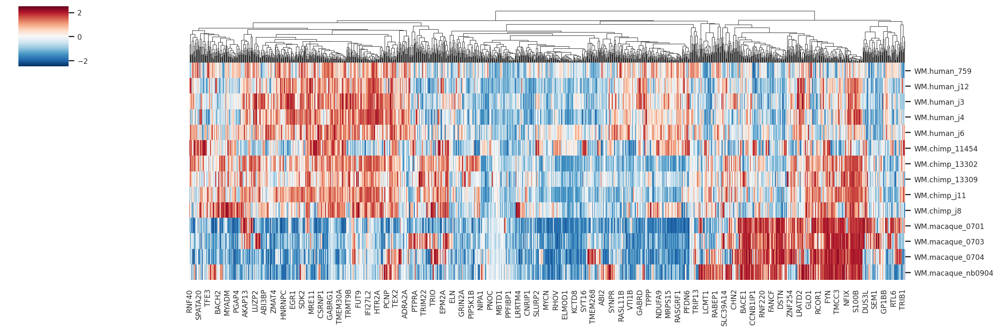

In [32]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df_hs.loc[df_hs.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(15, 5), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False).savefig(f'heatmap_norm_hs_{layer}.png')

Сделаем кластеризацию по видам

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



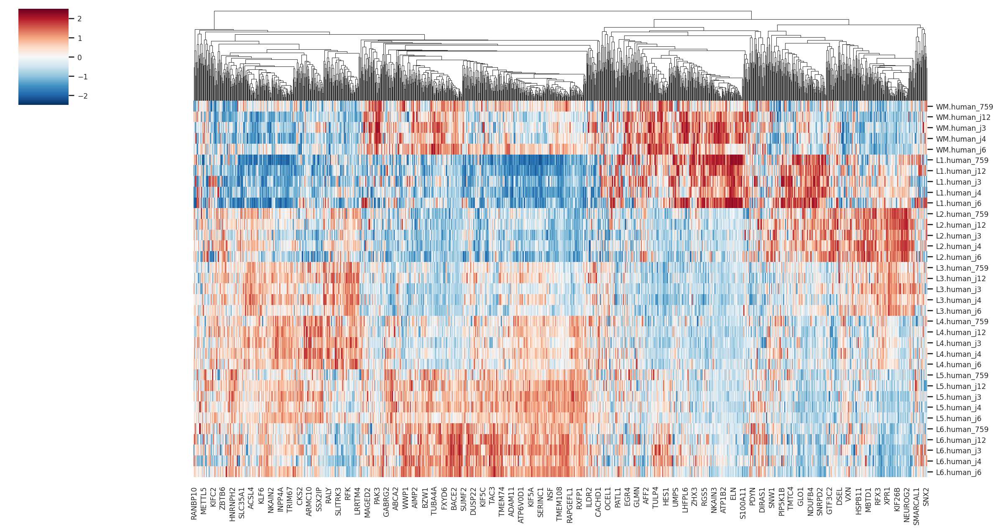

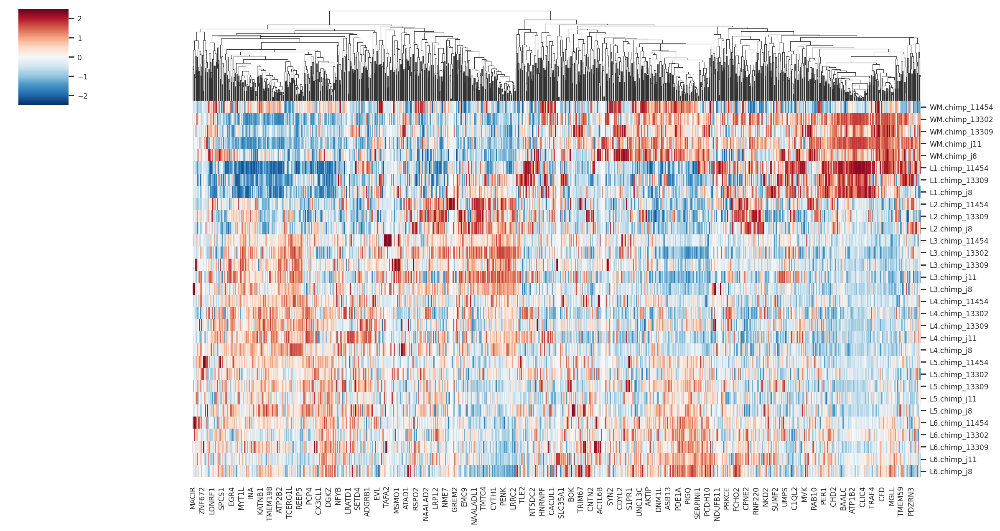

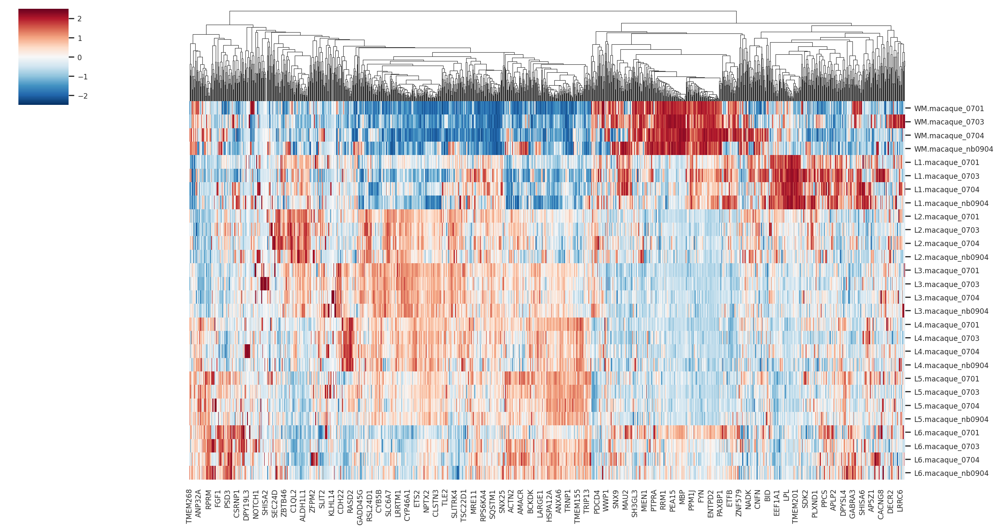

In [33]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df_hs.loc[df_hs.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False).savefig(f'heatmap_norm_hs_{cond}.png')

#### Гены которые значимо отличаются в двух видах

In [34]:
human_specific_genes_both = count_df[count_df['count'] == 2].index.unique().tolist()

In [35]:
df_hs = df[human_specific_genes_both].copy()
df_hs.head()

,PPCS,PPM1E,PPP1R1B,PRKCA,REPIN1,RPRM,NINL,NPPC,SLAIN1,SLC30A4,...,FYN,PCBP4,GRM3,CFD,CENPB,ACAP1,BEND6,BBC3,ARPP21,STAG1
WM.human_759,0.758167,-0.044925,1.987225,-1.016848,0.147048,0.565603,0.159591,1.708482,-0.740901,0.415486,...,-1.691262,0.429893,-0.244348,0.249310,-1.812127,2.077664,0.102525,-1.691704,1.316596,-1.032051
WM.human_j12,0.004118,0.025763,2.052955,-0.364159,0.559672,-0.084265,-0.590251,-0.217803,-0.512168,-0.558046,...,0.724029,-0.245471,0.026614,-0.077032,-1.271619,1.268498,0.383354,-1.127085,0.846763,-0.625285
WM.human_j3,0.425269,0.753265,1.083508,-0.020224,0.761086,-0.301676,-0.300881,0.674277,-0.173221,0.047230,...,0.305009,-1.464887,0.248668,-0.416585,-1.046896,1.197666,1.572990,-1.561139,1.590836,0.093146
WM.human_j4,-1.003522,0.271292,1.590886,-0.560765,1.742781,0.324833,0.058879,1.395977,0.145666,-1.185484,...,-0.999739,-1.147556,-0.267734,-0.580824,-1.951383,1.689702,1.032105,-1.831759,1.254812,-0.176460
WM.human_j6,0.489268,1.157688,1.936906,-0.194257,-0.040584,0.103549,-0.639580,1.983766,-0.391653,0.463353,...,-0.687337,-1.145869,1.018423,-0.806829,-1.109296,1.894061,0.325982,-1.234178,0.601249,-0.366122


/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



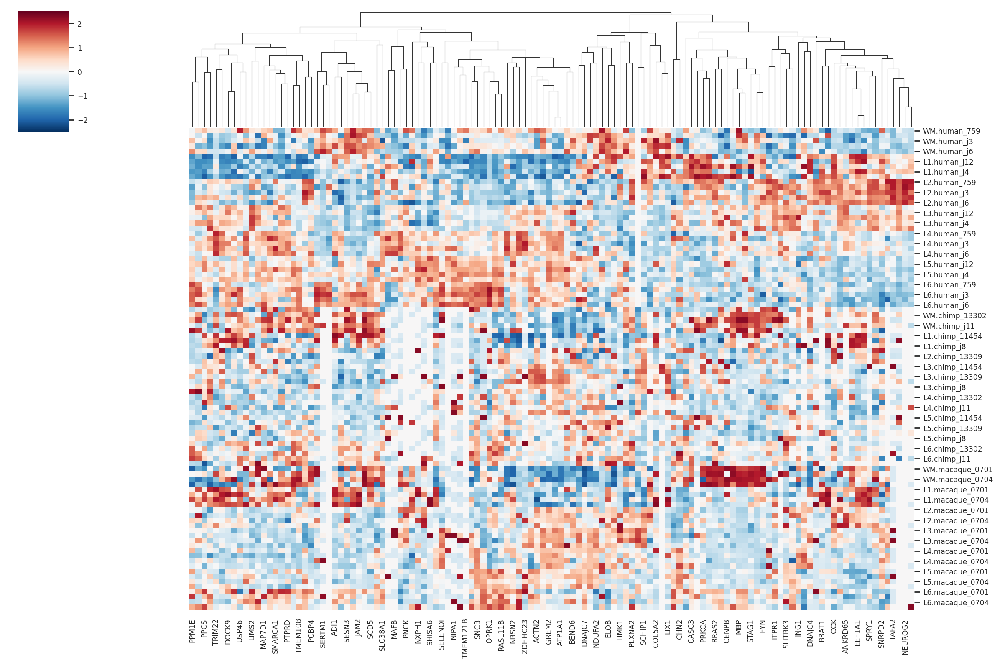

In [36]:
sns.clustermap(df_hs.loc[sample_order['all']], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('heatmap_norm_ohs.png')

Сделаем кластеризацию по слоям

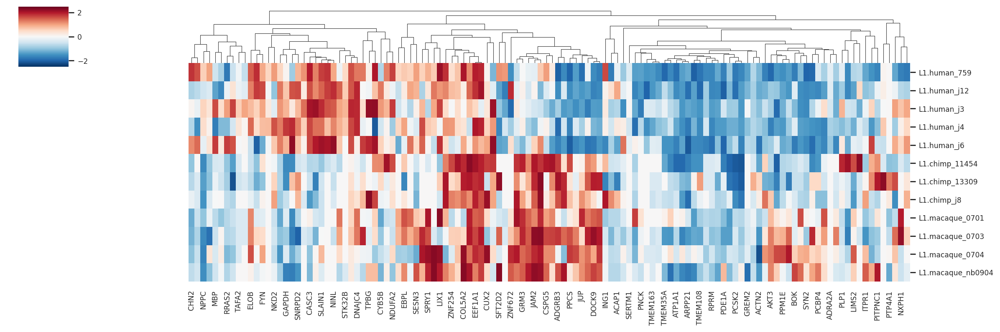

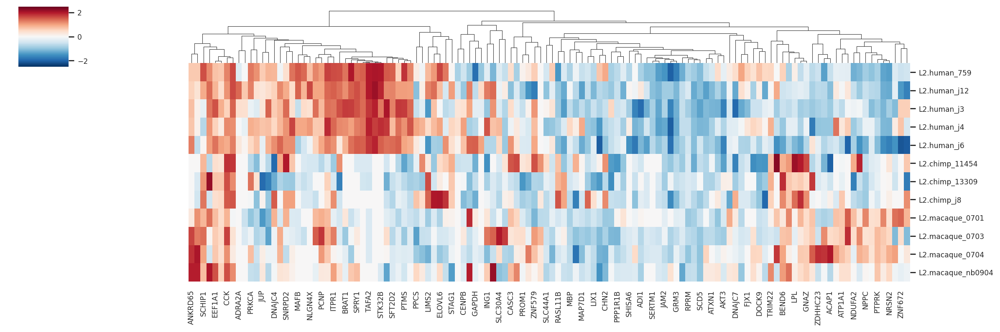

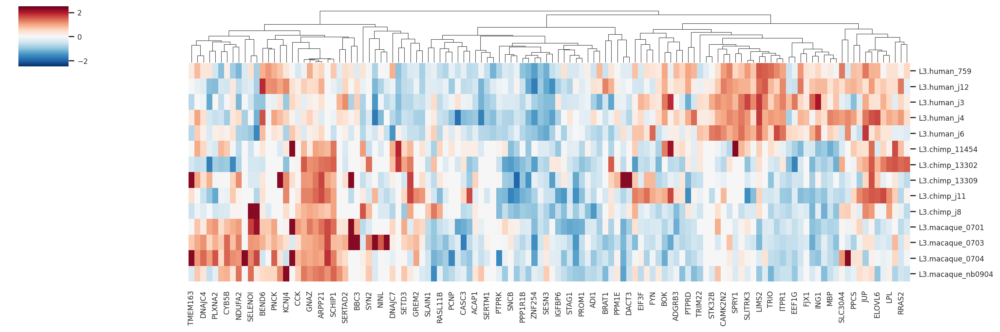

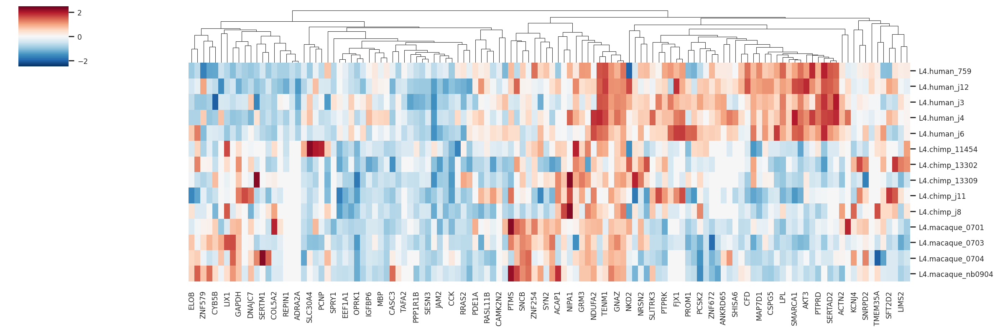

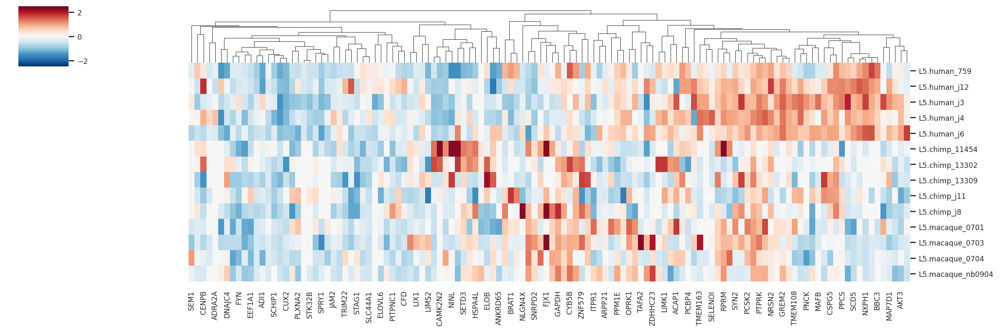

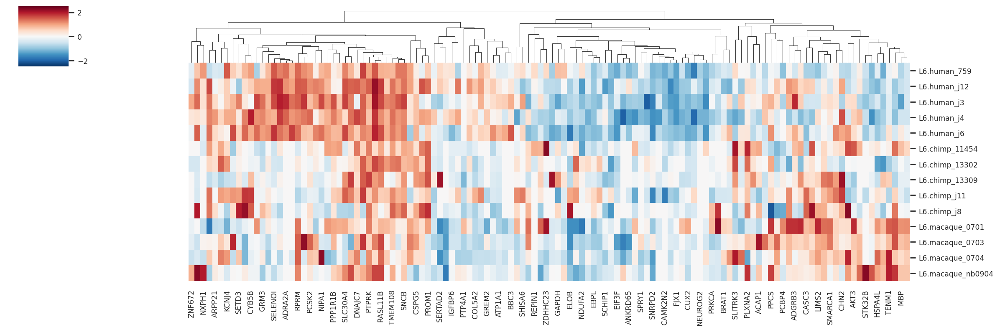

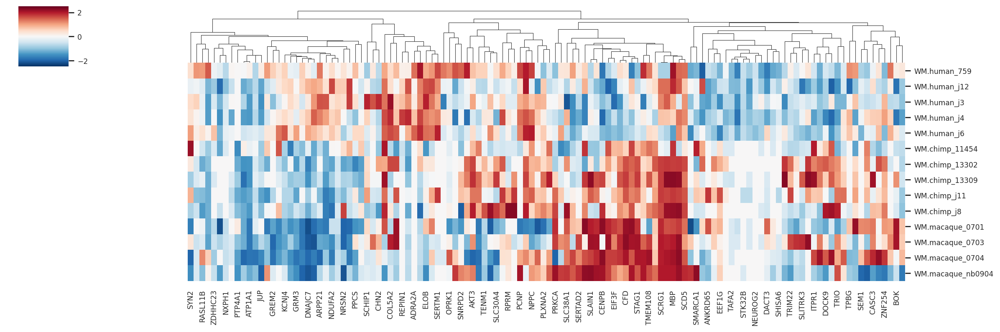

In [37]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df_hs.loc[df_hs.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(15, 5), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False).savefig(f'heatmap_norm_ohs_{layer}.png')

Сделаем кластеризацию по видам

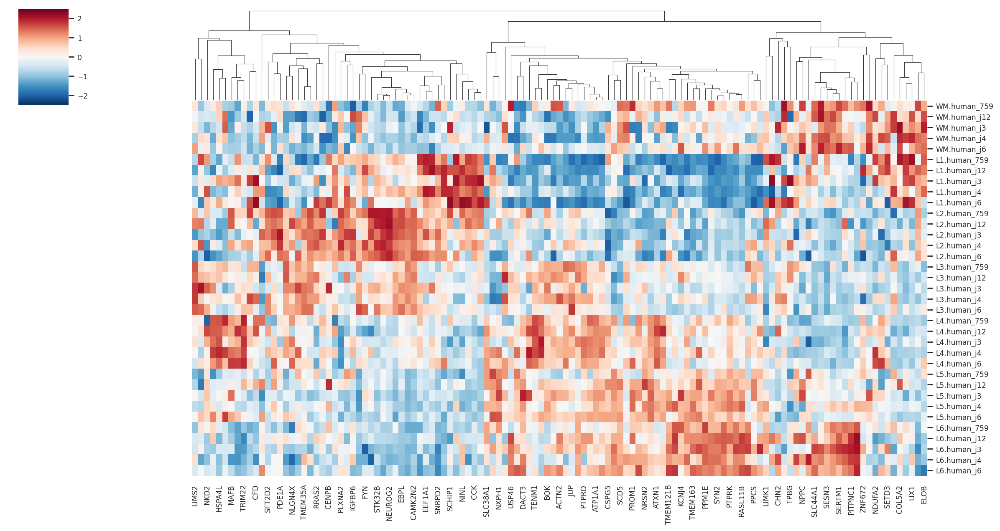

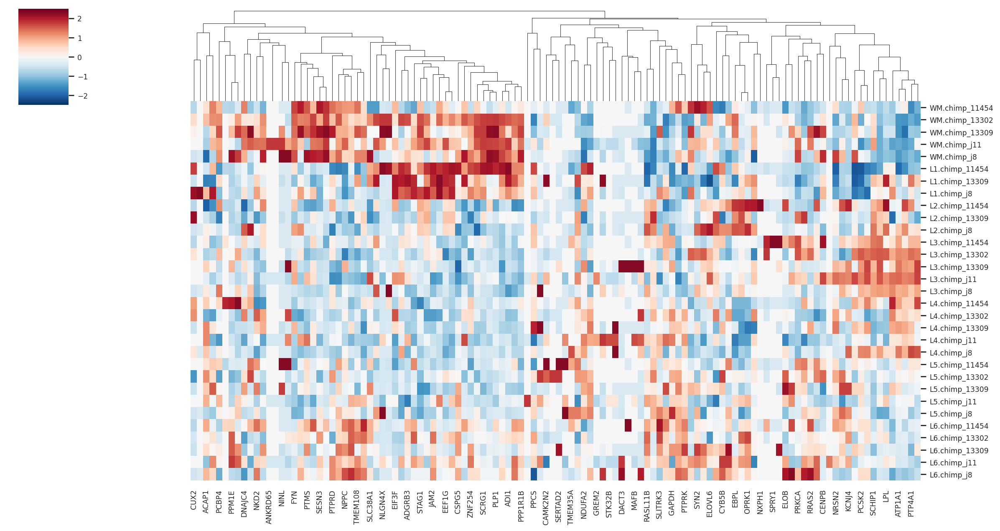

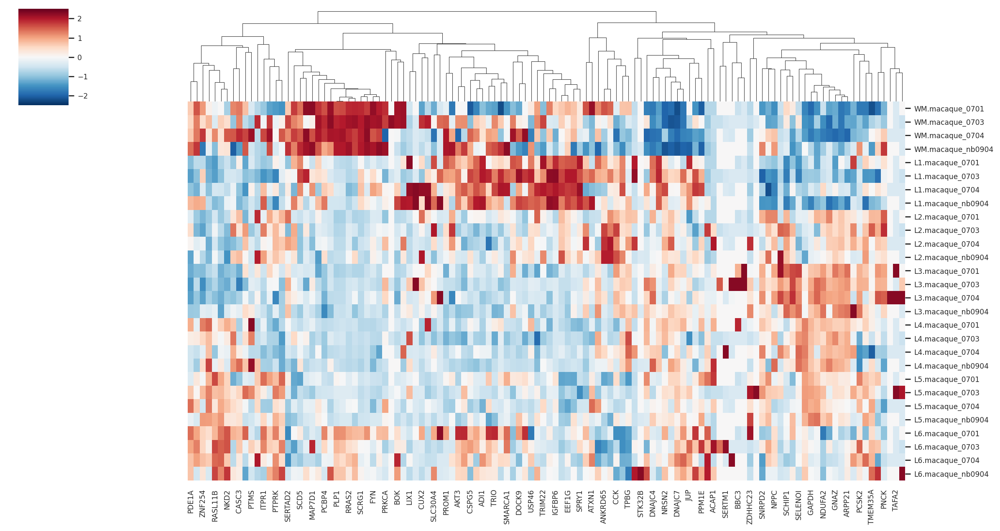

In [38]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df_hs.loc[df_hs.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False).savefig(f'heatmap_norm_ohs_{cond}.png')